# Book Recommenmdation System

In a very general way, recommender systems are algorithms aimed at suggesting relevant items to users (items being movies to watch, text to read, products to buy, or anything else depending on industries).
Recommender systems are really critical in some industries as they can generate a huge amount of income when they are efficient or also be a way to stand out significantly from competitors. The main objective is to create a book recommendation system for users.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#Importinf Libraries
import pandas as pd
import sys
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
# This is to supress the warning messages (if any) generated in our code
import warnings
warnings.filterwarnings('ignore')


# Data
● Users :
Contains the users. Note that user IDs (User-ID) have been anonymized and map to integers. Demographic data is provided (Location, Age) if available. Otherwise, these fields contain NULL values.
● Books :
Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (Book-Title, Book-Author, Year-Of-Publication, Publisher), obtained from Amazon Web Services. Note that in the case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavors (Image-URL-S, Image-URL-M, Image-URL-L), i.e., small, medium, large. These URLs point to the Amazon website.
● Ratings :
Contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

# Importing Dataset

In [3]:
#Users data
users = pd.read_csv('/content/drive/MyDrive/Project Recommendations P327 Group 1/Book-Recommondation/Users.csv')
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [4]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [5]:
#Book data
books = pd.read_csv('/content/drive/MyDrive/Project Recommendations P327 Group 1/Book-Recommondation/Books.csv')
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [6]:
#Rating data
ratings = pd.read_csv('/content/drive/MyDrive/Project Recommendations P327 Group 1/Book-Recommondation/Ratings.csv')
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [7]:
# Dimension of Dataset


In [8]:
users.shape,ratings.shape,books.shape

((278858, 3), (1149780, 3), (271360, 8))

# 1) Users_dataset

In [9]:
def missing_values(df):
    mis_val=df.isnull().sum()
    mis_val_percent=round(df.isnull().mean().mul(100),2)
    mz_table=pd.concat([mis_val,mis_val_percent],axis=1)
    mz_table=mz_table.rename(
    columns={df.index.name:'col_name',0:'Missing Values',1:'% of Total Values'})
    mz_table['Data_type']=df.dtypes
    mz_table=mz_table.sort_values('% of Total Values',ascending=False)
    return mz_table.reset_index()

In [10]:
missing_values(users)

,index,Missing Values,% of Total Values,Data_type
0,Age,110762,39.72,float64
1,User-ID,0,0.00,int64
2,Location,0,0.00,object


    Age have about 39% of missing values.

In [11]:
#Age distribution

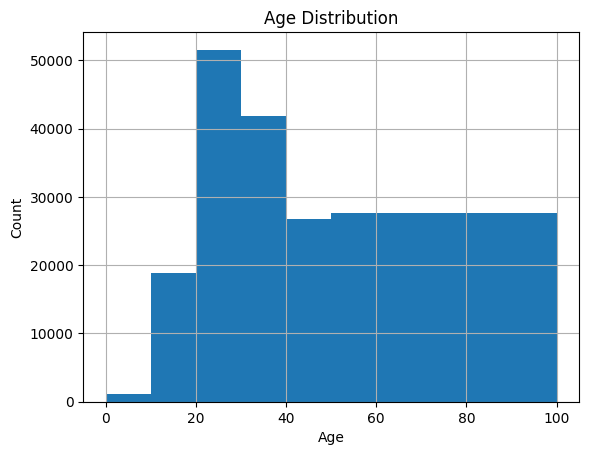

In [12]:
users.Age.hist(bins=[0,10,20,30,40,50,100])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

The most active users are ampong those in their 20-40s of age

Text(0.5, 1.0, 'Find outlier data in Age column')

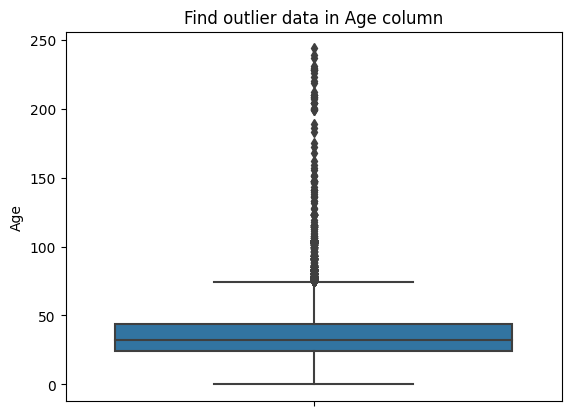

In [13]:
#Outliers detection
sns.boxplot(y = 'Age', data= users)
plt.title('Find outlier data in Age column')

In [14]:
print(sorted(users.Age.unique()))

[nan, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 113.0, 114.0, 115.0, 116.0, 118.0, 119.0, 123.0, 124.0, 127.0, 128.0, 132.0, 133.0, 136.0, 137.0, 138.0, 140.0, 141.0, 143.0, 146.0, 147.0, 148.0, 151.0, 152.0, 156.0, 157.0, 159.0, 162.0, 168.0, 172.0, 175.0, 183.0, 186.0, 189.0, 199.0, 200.0, 201.0, 204.0, 207.0, 208.0, 209.0, 210.0, 212.0, 219.0, 220.0, 223.0, 226.0

Ok we have Outlier data in Age

In [15]:
#lets find our unique value in location column

In [16]:
users.Location.unique()

array(['nyc, new york, usa', 'stockton, california, usa',
       'moscow, yukon territory, russia', ...,
       'sergnano, lombardia, italy', 'stranraer, n/a, united kingdom',
       'tacoma, washington, united kingdom'], dtype=object)

In [17]:
users.Location.nunique()

57339

57339 unique values, its really hard to understand
so lets create column Country

In [18]:
for i in users :
    users['Country'] = users.Location.str.extract(r'\,+\s?(\w*\s?\w*)\"*$')

In [19]:
users.Country.nunique()

529

In [20]:
#drop location column
users.drop('Location',axis=1,inplace=True)

In [21]:
users

,User-ID,Age,Country
0,1,NaN,usa
1,2,18.0,usa
2,3,NaN,russia
3,4,17.0,portugal
4,5,NaN,united kingdom
...,...,...,...
278853,278854,NaN,usa
278854,278855,50.0,united kingdom
278855,278856,NaN,canada
278856,278857,NaN,usa


In [22]:
users.isnull().sum()

User-ID         0
Age        110762
Country       368
dtype: int64

In [23]:
users['Country'] = users['Country'].astype('str')

In [24]:
a = list(users.Country.unique())
a =set(a)
a= list(a)
a = [x for x in a if x is not None]
a.sort()
print(a)

['', '01776', '02458', '19104', '23232', '30064', '85021', '87510', '_ brasil', 'a', 'aaa', 'adsgfdr', 'afghanistan', 'ahrensburg', 'alachua', 'albania', 'alderney', 'algeria', 'algérie', 'allen', 'ama lurra', 'america', 'american samoa', 'andorra', 'angola', 'antarctica', 'aotearoa', 'argentina', 'armenia', 'aroostook', 'aruba', 'asturies', 'auckland', 'austbritania', 'australia', 'australii', 'austria', 'autralia', 'az', 'azerbaijan', 'bademn würtemberg', 'bahamas', 'bahrain', 'baltimore', 'bangladesh', 'barbados', 'basilicata', 'basque country', 'bavaria', 'baxter', 'bbbzzzzz', 'belarus', 'belgi', 'belgique', 'belgium', 'belize', 'bell', 'benin', 'berguedà', 'bermuda', 'bernalillo', 'bfe', 'bhutan', 'bih', 'bkk', 'bladen', 'bolivia', 'bosnia', 'botswana', 'brasil', 'brazil', 'brunei', 'brunei darussalam', 'bucks', 'bulgaria', 'buncombe', 'burkina faso', 'burkinafasu', 'burlington', 'burma', 'butler', 'c', 'cadd0', 'calabria', 'california', 'cambodia', 'camden', 'cameroon', 'can', 'c

Some data has Misspellings , Lets correct it.

In [25]:
users['Country'].replace(['','01776','02458','19104','23232','30064','85021','87510','alachua','america','austria','autralia','cananda','geermany','italia','united kindgonm','united sates','united staes','united state','united states','us'],
                           ['other','usa','usa','usa','usa','usa','usa','usa','usa','usa','australia','australia','canada','germany','italy','united kingdom','usa','usa','usa','usa','usa'],inplace=True)

Text(0.5, 1.0, 'Count of users Country wise')

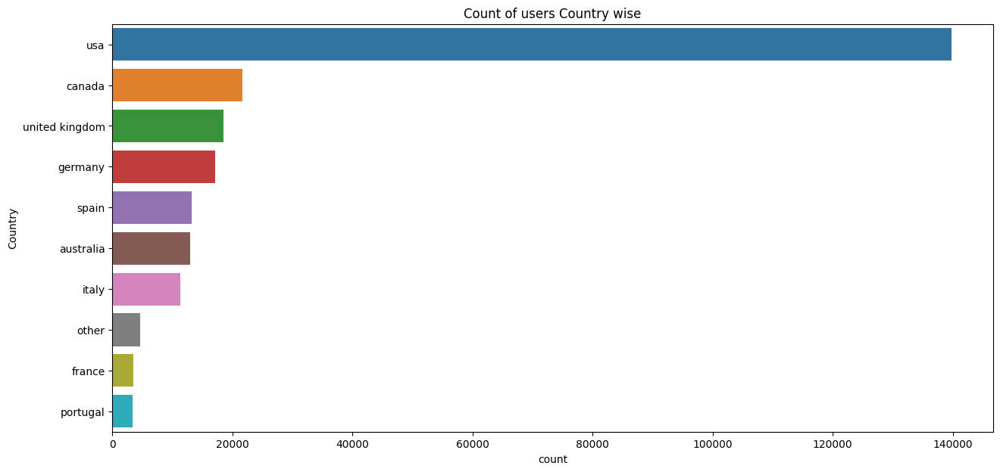

In [26]:
plt.figure(figsize=(15,7))
sns.countplot(y='Country',data=users,order=pd.value_counts(users['Country']).iloc[:10].index)
plt.title('Count of users Country wise')

Most number of users are from USA

In [27]:
#Lets treat outliers in users age

Text(0.5, 1.0, 'Age Distribution Plot')

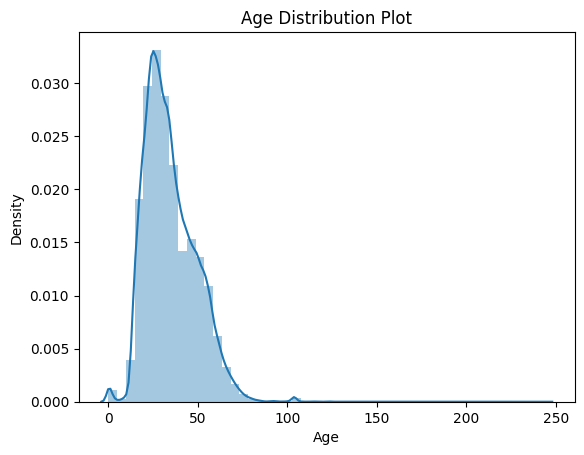

In [28]:
sns.distplot(users.Age)
plt.title('Age Distribution Plot')

Age value's below 5 and above 100 do not make much sense for our book rating case...hence replacing these by NaNs

In [29]:
#Outlier data became NaN
users.loc[(users.Age > 100) | (users.Age < 5), 'Age'] = np.nan

In [30]:
users.isna().sum()

User-ID         0
Age        112010
Country         0
dtype: int64

Age has positive Skewness (right tail) so we can use median to fill Nan values, but for this we don't like to fill Nan value just for one range of age. To handle this we'll use country column to fill Nan.

In [31]:
users['Age'] = users['Age'].fillna(users.groupby('Country')['Age'].transform('median'))

In [32]:
users.isna().sum()

User-ID      0
Age        276
Country      0
dtype: int64

Still we have 276 Nan values let's fill them with mean

In [33]:
users['Age'].fillna(users.Age.mean(), inplace=True)

In [34]:
users.isna().sum()

User-ID    0
Age        0
Country    0
dtype: int64

# 2)Books_Dataset

In [35]:
books

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [36]:
books.head(2)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...


In [37]:
#Top 10 Authors which have written the most books.

Text(0.5, 1.0, 'Top 10 Authors')

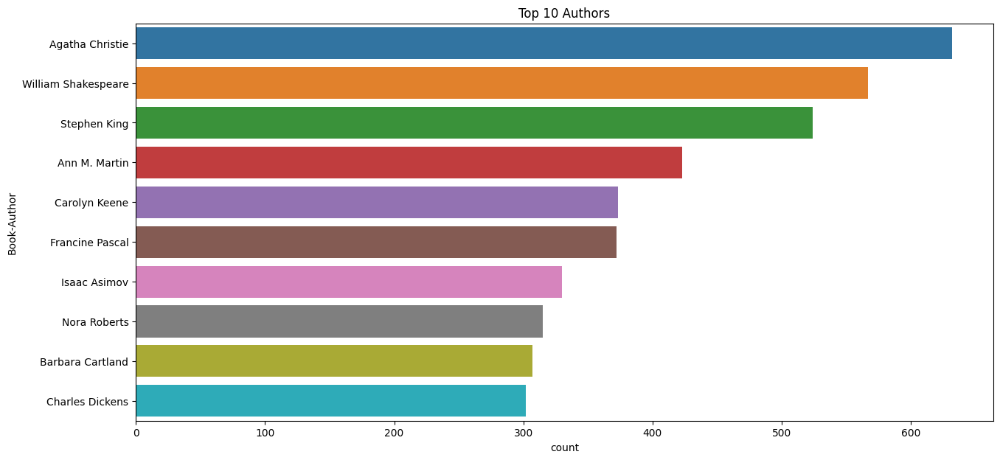

In [38]:
plt.figure(figsize=(15,7))
sns.countplot(y='Book-Author',data=books,order=pd.value_counts(books['Book-Author']).iloc[:10].index)
plt.title('Top 10 Authors')

In [39]:
#Top 10 Publisher which have published the most books

Text(0.5, 1.0, 'Top 10 Publishers')

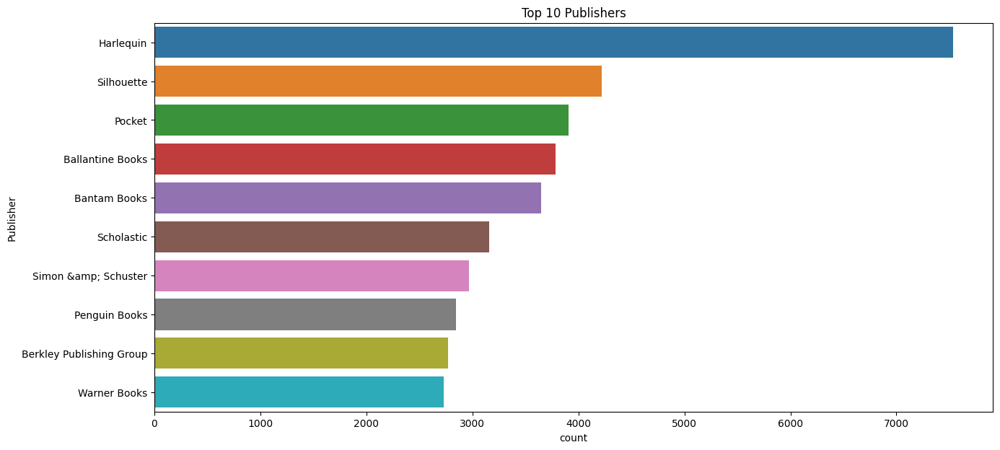

In [40]:
plt.figure(figsize=(15,7))
sns.countplot(y='Publisher',data=books,order=pd.value_counts(books['Publisher']).iloc[:10].index)
plt.title('Top 10 Publishers')

In [41]:
books['Year-Of-Publication']=books['Year-Of-Publication'].astype('str')
a=list(books['Year-Of-Publication'].unique())
a=set(a)
a=list(a)
a = [x for x in a if x is not None]
a.sort()
print(a)

['0', '1376', '1378', '1806', '1897', '1900', '1901', '1902', '1904', '1906', '1908', '1909', '1910', '1911', '1914', '1917', '1919', '1920', '1921', '1922', '1923', '1924', '1925', '1926', '1927', '1928', '1929', '1930', '1931', '1932', '1933', '1934', '1935', '1936', '1937', '1938', '1939', '1940', '1941', '1942', '1943', '1944', '1945', '1946', '1947', '1948', '1949', '1950', '1951', '1952', '1953', '1954', '1955', '1956', '1957', '1958', '1959', '1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968', '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2008', '2010', '2011', '2012', '2020', '2021', '2024', '2026', '2030', '2037', '2038', '2050', 'DK Publishing Inc', 'Gallimard']


In [42]:
#investigating the rows having 'DK Publishing Inc' as year Of Publication
books.loc[books['Year-Of-Publication'] == 'DK Publishing Inc',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,NaN
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Book...",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,NaN


As it can be seen from above that there are some incorrect entries in Year-Of-Publication field. It looks like Publisher names 'DK Publishing Inc' and 'Gallimard' have been incorrectly loaded as Year-Of-Publication in dataset due to some errors in csv file

In [43]:
#From above, it is seen that bookAuthor is incorrectly loaded with bookTitle, hence making required corrections
#ISBN '0789466953'
books.loc[books.ISBN == '0789466953','Year-Of-Publication'] = 2000
books.loc[books.ISBN == '0789466953','Book-Author'] = "James Buckley"
books.loc[books.ISBN == '0789466953','Publisher'] = "DK Publishing Inc"
books.loc[books.ISBN == '0789466953','Book-Title'] = "DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)"

In [44]:
#ISBN '078946697X'
books.loc[books.ISBN == '078946697X','Year-Of-Publication'] = 2000
books.loc[books.ISBN == '078946697X','Book-Author'] = "Michael Teitelbaum"
books.loc[books.ISBN == '078946697X','Publisher'] = "DK Publishing Inc"
books.loc[books.ISBN == '078946697X','Book-Title'] = "DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)"

In [45]:
#rechecking
books.loc[(books.ISBN == '0789466953') | (books.ISBN == '078946697X'),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",Michael Teitelbaum,2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,NaN
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Book...",James Buckley,2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,NaN


In [46]:
#investigating the rows having 'Gallimard' as yearOfPublication
books.loc[books['Year-Of-Publication'] == 'Gallimard',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-M...",2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,NaN


In [47]:
#making required corrections as above, keeping other fields intact
books.loc[books.ISBN == '2070426769','Year-Of-Publication'] = 2003
books.loc[books.ISBN == '2070426769','Book-Author'] = "Jean-Marie Gustave Le ClÃ?Â©zio"
books.loc[books.ISBN == '2070426769','Publisher'] = "Gallimard"
books.loc[books.ISBN == '2070426769','Book-Title'] = "Peuple du ciel, suivi de 'Les Bergers"


books.loc[books.ISBN == '2070426769',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers",Jean-Marie Gustave Le ClÃ?Â©zio,2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,NaN


In [48]:
books['Year-Of-Publication']=pd.to_numeric(books['Year-Of-Publication'], errors='coerce')

print(sorted(books['Year-Of-Publication'].unique()))
#Now it can be seen that yearOfPublication has all values as integers

[0, 1376, 1378, 1806, 1897, 1900, 1901, 1902, 1904, 1906, 1908, 1909, 1910, 1911, 1914, 1917, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2008, 2010, 2011, 2012, 2020, 2021, 2024, 2026, 2030, 2037, 2038, 2050]


The value 0 for Year-Of_Publication is invalid and as this dataset was published in 2004, We have assumed that the years after 2006 to be invalid and setting invalid years as NaN

Reference of the fact: http://www2.informatik.uni-freiburg.de/~cziegler/BX/

In [49]:
books.loc[(books['Year-Of-Publication'] > 2006) | (books['Year-Of-Publication'] == 0),'Year-Of-Publication'] = np.NAN

#replacing NaNs with median value of Year-Of-Publication
books['Year-Of-Publication'].fillna(round(books['Year-Of-Publication'].median()), inplace=True)

In [50]:
#dropping last three columns containing image URLs which will not be required for analysis
books.drop(['Image-URL-S', 'Image-URL-M', 'Image-URL-L'],axis=1,inplace=True)

In [51]:
books.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
dtype: int64

In [52]:
#exploring 'publisher' column
books.loc[books.Publisher.isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002.0,NaN
129037,1931696993,Finders Keepers,Linnea Sinclair,2001.0,NaN


In [53]:
#Filling Nan of Publisher with others
books.Publisher.fillna('other',inplace=True)

In [54]:
#exploring 'Book-Author' column
books.loc[books['Book-Author'].isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
187689,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995.0,Edinburgh Financial Publishing


In [55]:
#Filling Nan of Book-Author with others
books['Book-Author'].fillna('other',inplace=True)

In [56]:
books.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

# 3) Ratings Dataset

In [57]:
ratings

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6
...,...,...,...
1149775,276704,1563526298,9
1149776,276706,0679447156,0
1149777,276709,0515107662,10
1149778,276721,0590442449,10


Ratings dataset should have books only which exist in our books dataset

In [58]:
ratings_new = ratings[ratings.ISBN.isin(books.ISBN)]
ratings.shape, ratings_new.shape

((1149780, 3), (1031136, 3))

It can be seen that many rows having book ISBN not part of books dataset got dropped off

Ratings dataset should have ratings from users which exist in users dataset.



In [59]:
print("Shape of dataset before dropping",ratings_new.shape)
ratings_new = ratings_new[ratings_new['User-ID'].isin(users['User-ID'])]
print("shape of dataset after dropping",ratings_new.shape)

Shape of dataset before dropping (1031136, 3)
shape of dataset after dropping (1031136, 3)


It can be seen that no new user was there in ratings dataset.

Let's see how the ratings are distributed

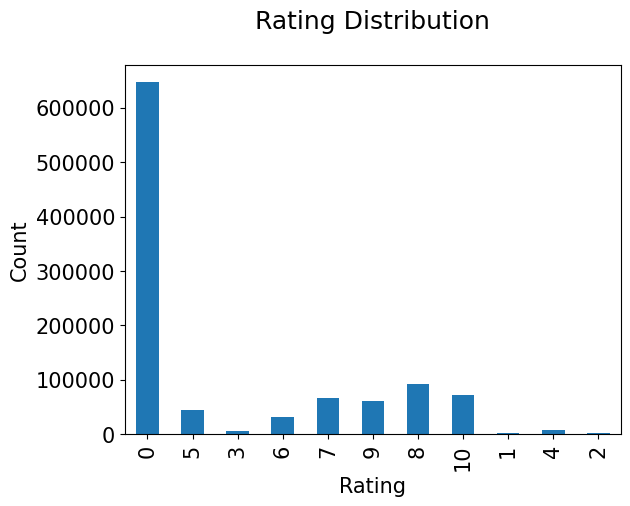

In [60]:
plt.rc("font", size=15)
ratings_new['Book-Rating'].value_counts(sort=False).plot(kind='bar')
plt.title('Rating Distribution\n')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

The ratings are very unevenly distributed, and the vast majority of ratings are 0 .As quoted in the description of the dataset - BX-Book-Ratings contains the book rating information. Ratings are either explicit, expressed on a scale from 1-10 higher values denoting higher appreciation, or implicit, expressed by 0.Hence segragating implicit and explict ratings datasets

In [61]:
#Hence segragating implicit and explict ratings datasets
ratings_explicit = ratings_new[ratings_new['Book-Rating'] != 0]
ratings_implicit = ratings_new[ratings_new['Book-Rating'] == 0]

In [62]:
print('ratings_explicit dataset',ratings_explicit.shape)
print('ratings_implicit dataset',ratings_implicit.shape)

ratings_explicit dataset (383842, 3)
ratings_implicit dataset (647294, 3)


<Axes: xlabel='Book-Rating', ylabel='count'>

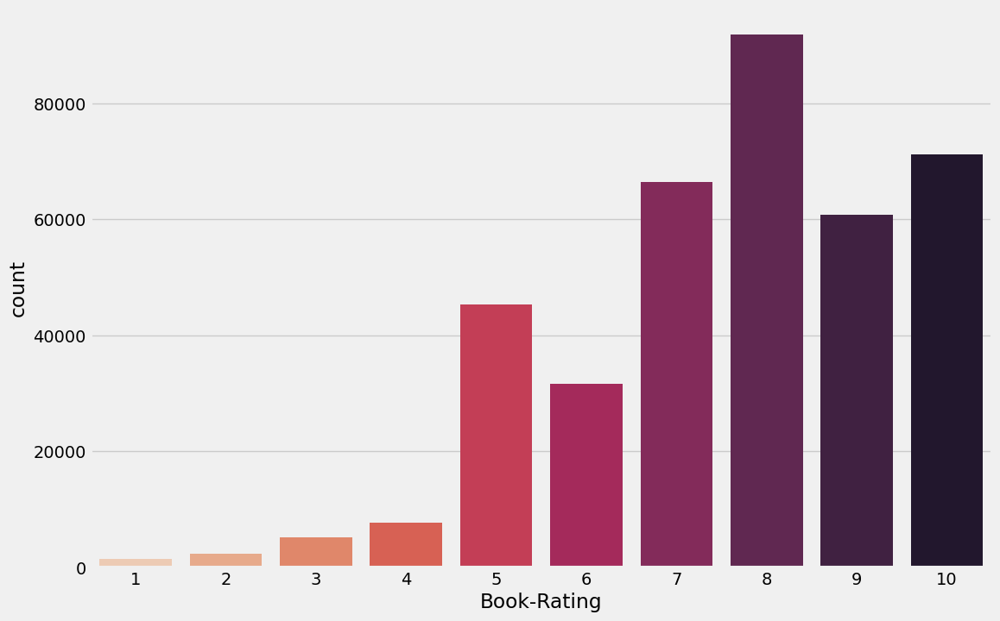

In [63]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(12, 8))
sns.countplot(data=ratings_explicit , x='Book-Rating', palette='rocket_r')

It can be observe that higher ratings are more common amongst users and rating 8 has been rated highest number of times

In [64]:
#Let's find the top 5 books which are rated by most number of users.
rating_count = pd.DataFrame(ratings_explicit.groupby('ISBN')['Book-Rating'].count())
rating_count.sort_values('Book-Rating', ascending=False).head()

,Book-Rating
ISBN,
0316666343,707
0971880107,581
0385504209,487
0312195516,383
0060928336,320


The book with ISBN '0316666343' received the most rating counts.

In [65]:
#Let’s find out what book it is, and what books are in the top 5.
most_rated_books = pd.DataFrame(['0316666343', '0971880107', '0385504209', '0312195516', '0060928336'], index=np.arange(5), columns = ['ISBN'])
most_rated_books_summary = pd.merge(most_rated_books, books, on='ISBN')
most_rated_books_summary

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0316666343,The Lovely Bones: A Novel,Alice Sebold,2002.0,"Little, Brown"
1,0971880107,Wild Animus,Rich Shapero,2004.0,Too Far
2,0385504209,The Da Vinci Code,Dan Brown,2003.0,Doubleday
3,0312195516,The Red Tent (Bestselling Backlist),Anita Diamant,1998.0,Picador USA
4,0060928336,Divine Secrets of the Ya-Ya Sisterhood: A Novel,Rebecca Wells,1997.0,Perennial


The book that received the most rating counts in this data set is Rich Shapero’s “Wild Animus”. And there is something in common among these five books that received the most rating counts — they are all novels. So it is conclusive that novels are popular and likely receive more ratings.

In [66]:
#create column Rating Average
ratings_explicit ['Avg_Rating'] = ratings_explicit.groupby('ISBN')['Book-Rating'].transform('mean')

In [67]:
#Cearting column Rating sum
ratings_explicit['Total_No_Of_Users_Rated']=ratings_explicit.groupby('ISBN')['Book-Rating'].transform('count')

In [68]:
ratings_explicit

,User-ID,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated
1,276726,0155061224,5,5.000000,1
3,276729,052165615X,3,3.000000,1
4,276729,0521795028,6,6.000000,1
8,276744,038550120X,7,7.580247,81
16,276747,0060517794,9,8.000000,30
...,...,...,...,...,...
1149771,276704,0743211383,7,6.964912,57
1149773,276704,0806917695,5,5.000000,1
1149775,276704,1563526298,9,7.000000,3
1149777,276709,0515107662,10,8.444444,18


# Merging All Dataset

In [69]:
Final_Dataset=users.copy()
Final_Dataset=pd.merge(Final_Dataset,ratings_explicit,on='User-ID')
Final_Dataset=pd.merge(Final_Dataset,books,on='ISBN')

In [70]:
Final_Dataset

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,8,33.0,canada,0002005018,5,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
1,11676,28.0,nan,0002005018,8,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
2,67544,30.0,canada,0002005018,8,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,0002005018,9,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
4,123629,33.0,canada,0002005018,9,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
...,...,...,...,...,...,...,...,...,...,...,...
383837,278851,33.0,usa,0767907566,5,5.000000,1,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books
383838,278851,33.0,usa,0789721260,5,5.000000,1,WebClasses From Scratch,Jesse Liberty,1999.0,Que
383839,278851,33.0,usa,0884159221,7,7.000000,1,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books
383840,278851,33.0,usa,0912333022,7,7.000000,1,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books


In [71]:
missing_values(Final_Dataset)

,index,Missing Values,% of Total Values,Data_type
0,User-ID,0,0.0,int64
1,Age,0,0.0,float64
2,Country,0,0.0,object
3,ISBN,0,0.0,object
4,Book-Rating,0,0.0,int64
5,Avg_Rating,0,0.0,float64
6,Total_No_Of_Users_Rated,0,0.0,int64
7,Book-Title,0,0.0,object
8,Book-Author,0,0.0,object
9,Year-Of-Publication,0,0.0,float64


In [72]:
Final_Dataset.shape

(383842, 11)

# Collaborative Filtering based Recommendation System

In [73]:
Final_Dataset

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,8,33.0,canada,0002005018,5,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
1,11676,28.0,nan,0002005018,8,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
2,67544,30.0,canada,0002005018,8,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,0002005018,9,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
4,123629,33.0,canada,0002005018,9,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
...,...,...,...,...,...,...,...,...,...,...,...
383837,278851,33.0,usa,0767907566,5,5.000000,1,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books
383838,278851,33.0,usa,0789721260,5,5.000000,1,WebClasses From Scratch,Jesse Liberty,1999.0,Que
383839,278851,33.0,usa,0884159221,7,7.000000,1,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books
383840,278851,33.0,usa,0912333022,7,7.000000,1,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books


In [74]:
x = Final_Dataset.groupby('User-ID').count()['Book-Rating'] >50
y = x[x].index

In [75]:
x

User-ID
8         False
9         False
12        False
14        False
16        False
          ...  
278846    False
278849    False
278851    False
278852    False
278854    False
Name: Book-Rating, Length: 68091, dtype: bool

In [76]:
y

Int64Index([   254,    638,   1424,   1733,   1903,   2033,   2110,   2276,
              2766,   2891,
            ...
            274004, 274061, 274111, 274301, 275970, 276680, 277427, 278137,
            278188, 278418],
           dtype='int64', name='User-ID', length=1150)

In [77]:
filtered_rating = Final_Dataset[Final_Dataset['User-ID'].isin(y)]

In [78]:
filtered_rating

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
1,11676,28.0,nan,0002005018,8,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,0002005018,9,7.666667,9,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
19,6242,33.0,canada,0452264464,5,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
22,11676,28.0,nan,0452264464,8,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
27,22625,54.0,usa,0452264464,9,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
...,...,...,...,...,...,...,...,...,...,...,...
383771,278418,36.0,usa,0821726595,6,6.000000,1,Mistress of Falcon Court,Charlotte Lammert,1989.0,Kensington Pub Corp (Mm)
383772,278418,36.0,usa,0865926433,5,5.000000,1,Yogi Bear and the Uojpbtcutpakic: Story,Horace J. Elias,1981.0,Granite Impex Ltd
383773,278418,36.0,usa,155882068X,5,5.000000,1,The Balloon Man (Crime Classics),Charlotte Armstrong,1990.0,Independent Pub Group
383774,278418,36.0,usa,1569751544,3,3.000000,1,The Sleep Solution: A 21-Night Program to Bett...,Nigel Ball,1998.0,Ulysses Press


In [79]:
y1 = filtered_rating.groupby('Book-Title').count()['Book-Rating']>= 10
famous_books = y1[y1].index

In [80]:
famous_books

Index(['1984', '1st to Die: A Novel', '2010: Odyssey Two',
       '2061: Odyssey Three', '2nd Chance', '311 Pelican Court', '3rd Degree',
       '4 Blondes', '84 Charing Cross Road',
       'A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))',
       ...
       'Wuthering Heights (Penguin Classics)', 'Xanth 14: Question Quest',
       'Xanth 15: The Color of Her Panties', 'YOU BELONG TO ME',
       'Year of Wonders', 'You Belong To Me', 'You Belong to Me', 'Yukon Ho!',
       'Zen and the Art of Motorcycle Maintenance: An Inquiry into Values',
       '\O\" Is for Outlaw"'],
      dtype='object', name='Book-Title', length=1697)

In [81]:
final_ratings = filtered_rating[filtered_rating['Book-Title'].isin(famous_books) ]
final_ratings

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
19,6242,33.0,canada,0452264464,5,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
22,11676,28.0,nan,0452264464,8,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
27,22625,54.0,usa,0452264464,9,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
31,36907,39.0,canada,0452264464,10,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
36,58363,81.0,usa,0452264464,5,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
...,...,...,...,...,...,...,...,...,...,...,...
381804,270820,52.0,usa,0606298347,7,7.000000,1,The Vision,Dean R. Koontz,1986.0,Turtleback Books Distributed by Demco Media
382030,271705,25.0,usa,0613212320,10,10.000000,1,Blindness (Harvest Book),Jose Saramago,2000.0,Sagebrush Bound
382625,274061,26.0,usa,1551663147,10,10.000000,1,Fever,Elizabeth Lowell,1997.0,Mira
382739,274301,41.0,australia,0449000729,10,10.000000,1,Sarum: The Novel of England,Edward Rutherfurd,1997.0,Ballantine Books


In [82]:
final_ratings['User-ID'].nunique()

1128

# Item- Item Based Filtering

In [83]:
pt = final_ratings.pivot_table(index='Book-Title',columns='User-ID',values='Book-Rating')

In [84]:
pt

User-ID,254,638,1424,1733,1903,2033,2110,2276,2766,2891,...,274004,274061,274111,274301,275970,276680,277427,278137,278188,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1st to Die: A Novel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010: Odyssey Two,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2061: Odyssey Three,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2nd Chance,NaN,9.0,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
You Belong To Me,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
You Belong to Me,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Yukon Ho!,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
pt.fillna(0,inplace=True)

In [86]:
pt

User-ID,254,638,1424,1733,1903,2033,2110,2276,2766,2891,...,274004,274061,274111,274301,275970,276680,277427,278137,278188,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1st to Die: A Novel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010: Odyssey Two,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2061: Odyssey Three,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2nd Chance,0.0,9.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
You Belong To Me,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
You Belong to Me,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yukon Ho!,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [87]:
#Calculate the distances and similarity

In [88]:
from sklearn.metrics import pairwise_distances

In [89]:
pd.DataFrame(pairwise_distances(pt, metric='cosine'))

,0,1,2,3,4,5,6,7,8,9,...,1687,1688,1689,1690,1691,1692,1693,1694,1695,1696
0,0.000000,0.921915,0.922000,1.000000,0.977839,1.000000,0.975444,1.000000,0.905599,0.966851,...,1.000000,0.941266,0.945909,0.935192,0.926449,0.964046,1.000000,0.936545,0.908542,0.949059
1,0.921915,0.000000,0.980429,1.000000,0.747002,1.000000,0.836919,1.000000,0.974759,0.948015,...,1.000000,1.000000,0.966221,0.882189,0.953766,0.861072,0.973516,0.936380,0.953663,0.867127
2,0.922000,0.980429,0.000000,0.767507,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.964586,1.000000,0.889645,1.000000,0.919550,1.000000
3,1.000000,1.000000,0.767507,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.911729,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
4,0.977839,0.747002,1.000000,1.000000,0.000000,0.897628,0.765893,1.000000,0.976759,0.902351,...,1.000000,1.000000,1.000000,0.808196,0.951919,0.880798,1.000000,0.965365,0.971627,0.907225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1692,0.964046,0.861072,1.000000,1.000000,0.880798,0.917980,0.971006,0.932572,0.962293,1.000000,...,1.000000,0.871575,0.881726,0.923478,1.000000,0.000000,1.000000,0.943807,0.963658,0.833170
1693,1.000000,0.973516,0.889645,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.867727,1.000000,1.000000,1.000000,0.000000,1.000000,0.912906,1.000000
1694,0.936545,0.936380,1.000000,1.000000,0.965365,1.000000,0.961622,1.000000,0.950088,1.000000,...,1.000000,1.000000,1.000000,0.862698,0.932776,0.943807,1.000000,0.000000,0.951895,0.958409
1695,0.908542,0.953663,0.919550,1.000000,0.971627,1.000000,0.975179,0.962893,0.967720,1.000000,...,0.951681,0.934036,1.000000,0.934493,1.000000,0.963658,0.912906,0.951895,0.000000,0.973102


In [90]:
sim = 1- pairwise_distances(pt, metric='cosine')
pd.DataFrame(sim)

,0,1,2,3,4,5,6,7,8,9,...,1687,1688,1689,1690,1691,1692,1693,1694,1695,1696
0,1.000000,0.078085,0.078000,0.000000,0.022161,0.000000,0.024556,0.000000,0.094401,0.033149,...,0.000000,0.058734,0.054091,0.064808,0.073551,0.035954,0.000000,0.063455,0.091458,0.050941
1,0.078085,1.000000,0.019571,0.000000,0.252998,0.000000,0.163081,0.000000,0.025241,0.051985,...,0.000000,0.000000,0.033779,0.117811,0.046234,0.138928,0.026484,0.063620,0.046337,0.132873
2,0.078000,0.019571,1.000000,0.232493,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.035414,0.000000,0.110355,0.000000,0.080450,0.000000
3,0.000000,0.000000,0.232493,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.088271,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.022161,0.252998,0.000000,0.000000,1.000000,0.102372,0.234107,0.000000,0.023241,0.097649,...,0.000000,0.000000,0.000000,0.191804,0.048081,0.119202,0.000000,0.034635,0.028373,0.092775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1692,0.035954,0.138928,0.000000,0.000000,0.119202,0.082020,0.028994,0.067428,0.037707,0.000000,...,0.000000,0.128425,0.118274,0.076522,0.000000,1.000000,0.000000,0.056193,0.036342,0.166830
1693,0.000000,0.026484,0.110355,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.132273,0.000000,0.000000,0.000000,1.000000,0.000000,0.087094,0.000000
1694,0.063455,0.063620,0.000000,0.000000,0.034635,0.000000,0.038378,0.000000,0.049912,0.000000,...,0.000000,0.000000,0.000000,0.137302,0.067224,0.056193,0.000000,1.000000,0.048105,0.041591
1695,0.091458,0.046337,0.080450,0.000000,0.028373,0.000000,0.024821,0.037107,0.032280,0.000000,...,0.048319,0.065964,0.000000,0.065507,0.000000,0.036342,0.087094,0.048105,1.000000,0.026898


In [91]:
np.fill_diagonal(sim,0)

In [92]:
similarity_item = pd.DataFrame(sim)
similarity_item

,0,1,2,3,4,5,6,7,8,9,...,1687,1688,1689,1690,1691,1692,1693,1694,1695,1696
0,0.000000,0.078085,0.078000,0.000000,0.022161,0.000000,0.024556,0.000000,0.094401,0.033149,...,0.000000,0.058734,0.054091,0.064808,0.073551,0.035954,0.000000,0.063455,0.091458,0.050941
1,0.078085,0.000000,0.019571,0.000000,0.252998,0.000000,0.163081,0.000000,0.025241,0.051985,...,0.000000,0.000000,0.033779,0.117811,0.046234,0.138928,0.026484,0.063620,0.046337,0.132873
2,0.078000,0.019571,0.000000,0.232493,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.035414,0.000000,0.110355,0.000000,0.080450,0.000000
3,0.000000,0.000000,0.232493,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.088271,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.022161,0.252998,0.000000,0.000000,0.000000,0.102372,0.234107,0.000000,0.023241,0.097649,...,0.000000,0.000000,0.000000,0.191804,0.048081,0.119202,0.000000,0.034635,0.028373,0.092775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1692,0.035954,0.138928,0.000000,0.000000,0.119202,0.082020,0.028994,0.067428,0.037707,0.000000,...,0.000000,0.128425,0.118274,0.076522,0.000000,0.000000,0.000000,0.056193,0.036342,0.166830
1693,0.000000,0.026484,0.110355,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.132273,0.000000,0.000000,0.000000,0.000000,0.000000,0.087094,0.000000
1694,0.063455,0.063620,0.000000,0.000000,0.034635,0.000000,0.038378,0.000000,0.049912,0.000000,...,0.000000,0.000000,0.000000,0.137302,0.067224,0.056193,0.000000,0.000000,0.048105,0.041591
1695,0.091458,0.046337,0.080450,0.000000,0.028373,0.000000,0.024821,0.037107,0.032280,0.000000,...,0.048319,0.065964,0.000000,0.065507,0.000000,0.036342,0.087094,0.048105,0.000000,0.026898


In [93]:
similarity_item.index = final_ratings['Book-Title'].unique()
similarity_item.columns = final_ratings['Book-Title'].unique()

In [94]:
pd.set_option('display.max_columns', None)

In [95]:
similarity_item

Beloved (Plume Contemporary Fiction)  \
Beloved (Plume Contemporary Fiction)                                            0.000000   
Airframe                                                                        0.078085   
Piercing the Darkness                                                           0.078000   
To Kill a Mockingbird                                                           0.000000   
Seabiscuit: An American Legend                                                  0.022161   
...                                                                                  ...   
Rilla of Ingleside (Anne of Green Gables Novels...                              0.035954   
Loyalty in Death                                                                0.000000   
After Twilight                                                                  0.063455   
Well-Schooled in Murder                                                         0.091458   
Killing Mr. Griffin (Laurel Leaf Books)                                         0.050941   

                                                    Airframe  \
Beloved (Plume Contemporary Fiction)                0.078085   
Airframe                                            0.000000   
Piercing the Darkness                               0.019571   
To Kill a Mockingbird                               0.000000   
Seabiscuit: An American Legend                      0.252998   
...                                                      ...   
Rilla of Ingleside (Anne of Green Gables Novels...  0.138928   
Loyalty in Death                                    0.026484   
After Twilight                                      0.063620   
Well-Schooled in Murder                             0.046337   
Killing Mr. Griffin (Laurel Leaf Books)             0.132873   

                                                    Piercing the Darkness  \
Beloved (Plume Contemporary Fiction)                             0.078000   
Airframe                                                         0.019571   
Piercing the Darkness                                            0.000000   
To Kill a Mockingbird                                            0.232493   
Seabiscuit: An American Legend                                   0.000000   
...                                                                   ...   
Rilla of Ingleside (Anne of Green Gables Novels...               0.000000   
Loyalty in Death                                                 0.110355   
After Twilight                                                   0.000000   
Well-Schooled in Murder                                          0.080450   
Killing Mr. Griffin (Laurel Leaf Books)                          0.000000   

                                                    To Kill a Mockingbird  \
Beloved (Plume Contemporary Fiction)                             0.000000   
Airframe                                                         0.000000   
Piercing the Darkness                                            0.232493   
To Kill a Mockingbird                                            0.000000   
Seabiscuit: An American Legend                                   0.000000   
...                                                                   ...   
Rilla of Ingleside (Anne of Green Gables Novels...               0.000000   
Loyalty in Death                                                 0.000000   
After Twilight                                                   0.000000   
Well-Schooled in Murder                                          0.000000   
Killing Mr. Griffin (Laurel Leaf Books)                          0.000000   

                                                    Seabiscuit: An American Legend  \
Beloved (Plume Contemporary Fiction)                                      0.022161   
Airframe                                                                  0.252998   
Piercing the Darkness                                                 

In [96]:
#Find out similar users

In [97]:
similarity_item.idxmax()

Beloved (Plume Contemporary Fiction)                                                               The Lake House
Airframe                                                                                 Angela's Ashes: A Memoir
Piercing the Darkness                                            The Book of Ruth (Oprah's Book Club (Paperback))
To Kill a Mockingbird                                           The Ritual Bath (Peter Decker &amp; Rina Lazar...
Seabiscuit: An American Legend                                                                         The Hobbit
                                                                                      ...                        
Rilla of Ingleside (Anne of Green Gables Novels (Paperback))                                           Back Roads
Loyalty in Death                                                                            It's Always Something
After Twilight                                                                          

In [98]:
from sklearn.metrics.pairwise import cosine_similarity

In [99]:
similarity_item_scores=cosine_similarity(pt)

In [100]:
similarity_item_scores[0]

array([1.        , 0.07808466, 0.07799952, ..., 0.06345498, 0.09145795,
       0.05094141])

In [101]:
similarity_item_scores.shape

(1697, 1697)

In [102]:
def recommend_for_item(book_name):
    index=np.where(pt.index==book_name)[0][0]
    distances=similarity_item_scores[index]
    similar_items=sorted(list(enumerate(similarity_item_scores[index])),key=lambda x:x[1], reverse=True)[1:11]
    data=[]
    for i in similar_items:
        item=[]
        temp_df = books[books['Book-Title'] == pt.index[i[0]]]
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Book-Title'].values))
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Book-Author'].values))

        data.append(item)
    return data

In [103]:
recommend_for_item('The Notebook')

[['Nights in Rodanthe', 'Nicholas Sparks'],
 ['A Walk to Remember', 'Nicholas Sparks'],
 ['The Rescue', 'Nicholas Sparks'],
 ['The Five People You Meet in Heaven', 'Mitch Albom'],
 ["Suzanne's Diary for Nicholas", 'James Patterson'],
 ['Book Club', 'Mary Alice Monroe'],
 ['Message in a Bottle', 'Nicholas Sparks'],
 ['One Door Away from Heaven', 'Dean R. Koontz'],
 ['While I Was Gone', 'Sue Miller'],
 ['The Ranch', 'DANIELLE STEEL']]

# User-User Based Filtering

In [104]:
final_ratings

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
19,6242,33.0,canada,0452264464,5,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
22,11676,28.0,nan,0452264464,8,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
27,22625,54.0,usa,0452264464,9,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
31,36907,39.0,canada,0452264464,10,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
36,58363,81.0,usa,0452264464,5,7.772152,79,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
...,...,...,...,...,...,...,...,...,...,...,...
381804,270820,52.0,usa,0606298347,7,7.000000,1,The Vision,Dean R. Koontz,1986.0,Turtleback Books Distributed by Demco Media
382030,271705,25.0,usa,0613212320,10,10.000000,1,Blindness (Harvest Book),Jose Saramago,2000.0,Sagebrush Bound
382625,274061,26.0,usa,1551663147,10,10.000000,1,Fever,Elizabeth Lowell,1997.0,Mira
382739,274301,41.0,australia,0449000729,10,10.000000,1,Sarum: The Novel of England,Edward Rutherfurd,1997.0,Ballantine Books


In [105]:
pt2 = final_ratings.pivot_table(index='User-ID',columns='Book-Title',values='Book-Rating')

In [106]:
pt2

Book-Title  1984  1st to Die: A Novel  2010: Odyssey Two  2061: Odyssey Three  \
User-ID                                                                         
254          9.0                  NaN                NaN                  NaN   
638          NaN                  NaN                NaN                  NaN   
1424         NaN                  NaN                NaN                  NaN   
1733         NaN                  NaN                NaN                  NaN   
1903         NaN                  NaN                NaN                  NaN   
...          ...                  ...                ...                  ...   
276680       NaN                  NaN                NaN                  NaN   
277427       NaN                  NaN                NaN                  NaN   
278137       NaN                  NaN                NaN                  NaN   
278188       NaN                  NaN                NaN                  NaN   
278418       NaN                  NaN                NaN                  NaN   

Book-Title  2nd Chance  311 Pelican Court  3rd Degree  4 Blondes  \
User-ID                                                            
254                NaN                NaN         NaN        NaN   
638                9.0                NaN         NaN        NaN   
1424               NaN                NaN         NaN        NaN   
1733               NaN                NaN         NaN        NaN   
1903               NaN                NaN         NaN        NaN   
...                ...                ...         ...        ...   
276680             NaN                NaN         NaN        NaN   
277427             NaN                NaN         NaN        NaN   
278137             NaN                NaN         NaN        NaN   
278188             NaN                NaN         NaN        NaN   
278418             NaN                NaN         NaN        NaN   

Book-Title  84 Charing Cross Road  \
User-ID                             
254                           NaN   
638                           NaN   
1424                          NaN   
1733                          NaN   
1903                          NaN   
...                           ...   
276680                        NaN   
277427                        NaN   
278137                        NaN   
278188                        NaN   
278418                        NaN   

Book-Title  A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))  \
User-ID                                                                                             
254                                                       NaN                                       
638                                                       NaN                                       
1424                                                      NaN                                       
1733                                                      NaN                                       
1903                                                      NaN                                       
...                                                       ...                                       
276680                                                    NaN                                       
277427                                                    NaN                                       
278137                                                    NaN                                       
278188                                                    NaN                                       
278418                                                    NaN                                       

Book-Title  A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash  \
User-ID                                                                                      
254                                                       NaN                

In [107]:
pt2.fillna(0,inplace=True)

In [108]:
pt2

Book-Title  1984  1st to Die: A Novel  2010: Odyssey Two  2061: Odyssey Three  \
User-ID                                                                         
254          9.0                  0.0                0.0                  0.0   
638          0.0                  0.0                0.0                  0.0   
1424         0.0                  0.0                0.0                  0.0   
1733         0.0                  0.0                0.0                  0.0   
1903         0.0                  0.0                0.0                  0.0   
...          ...                  ...                ...                  ...   
276680       0.0                  0.0                0.0                  0.0   
277427       0.0                  0.0                0.0                  0.0   
278137       0.0                  0.0                0.0                  0.0   
278188       0.0                  0.0                0.0                  0.0   
278418       0.0                  0.0                0.0                  0.0   

Book-Title  2nd Chance  311 Pelican Court  3rd Degree  4 Blondes  \
User-ID                                                            
254                0.0                0.0         0.0        0.0   
638                9.0                0.0         0.0        0.0   
1424               0.0                0.0         0.0        0.0   
1733               0.0                0.0         0.0        0.0   
1903               0.0                0.0         0.0        0.0   
...                ...                ...         ...        ...   
276680             0.0                0.0         0.0        0.0   
277427             0.0                0.0         0.0        0.0   
278137             0.0                0.0         0.0        0.0   
278188             0.0                0.0         0.0        0.0   
278418             0.0                0.0         0.0        0.0   

Book-Title  84 Charing Cross Road  \
User-ID                             
254                           0.0   
638                           0.0   
1424                          0.0   
1733                          0.0   
1903                          0.0   
...                           ...   
276680                        0.0   
277427                        0.0   
278137                        0.0   
278188                        0.0   
278418                        0.0   

Book-Title  A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))  \
User-ID                                                                                             
254                                                       0.0                                       
638                                                       0.0                                       
1424                                                      0.0                                       
1733                                                      0.0                                       
1903                                                      0.0                                       
...                                                       ...                                       
276680                                                    0.0                                       
277427                                                    0.0                                       
278137                                                    0.0                                       
278188                                                    0.0                                       
278418                                                    0.0                                       

Book-Title  A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash  \
User-ID                                                                                      
254                                                       0.0                

In [109]:
#Calculating distance and Similarity

In [110]:
pd.DataFrame(pairwise_distances(pt2, metric='cosine'))

0             1             2     3         4         5     \
0     1.110223e-16  1.000000e+00  1.000000e+00   1.0  1.000000  0.816938   
1     1.000000e+00  2.220446e-16  9.418335e-01   1.0  0.917313  1.000000   
2     1.000000e+00  9.418335e-01  1.110223e-16   1.0  1.000000  1.000000   
3     1.000000e+00  1.000000e+00  1.000000e+00   0.0  1.000000  1.000000   
4     1.000000e+00  9.173135e-01  1.000000e+00   1.0  0.000000  0.899269   
...            ...           ...           ...   ...       ...       ...   
1123  1.000000e+00  9.341138e-01  1.000000e+00   1.0  1.000000  1.000000   
1124  1.000000e+00  9.141963e-01  1.000000e+00   1.0  1.000000  1.000000   
1125  1.000000e+00  9.394233e-01  9.133642e-01   1.0  1.000000  0.966792   
1126  1.000000e+00  1.000000e+00  1.000000e+00   1.0  1.000000  1.000000   
1127  1.000000e+00  9.491691e-01  1.000000e+00   1.0  1.000000  1.000000   

          6         7         8         9         10    11        12    \
0     1.000000  1.000000  1.000000  0.945014  0.930199   1.0  0.816586   
1     1.000000  0.932186  0.895561  1.000000  1.000000   1.0  1.000000   
2     1.000000  1.000000  0.931995  0.940890  0.912460   1.0  1.000000   
3     0.862147  1.000000  0.994684  1.000000  1.000000   1.0  1.000000   
4     1.000000  1.000000  1.000000  1.000000  1.000000   1.0  1.000000   
...        ...       ...       ...       ...       ...   ...       ...   
1123  1.000000  1.000000  0.928667  0.946437  1.000000   1.0  1.000000   
1124  1.000000  1.000000  1.000000  0.950953  1.000000   1.0  1.000000   
1125  1.000000  1.000000  1.000000  0.917922  1.000000   1.0  1.000000   
1126  1.000000  1.000000  1.000000  1.000000  1.000000   1.0  1.000000   
1127  1.000000  1.000000  0.963889  1.000000  1.000000   1.0  1.000000   

          13        14    15    16        17        18        19        20    \
0     0.876007  1.000000   1.0   1.0  0.960021  1.000000  1.000000  0.875671   
1     1.000000  0.891638   1.0   1.0  1.000000  0.969502  0.900330  0.976119   
2     1.000000  0.974606   1.0   1.0  1.000000  1.000000  0.947764  1.000000   
3     1.000000  1.000000   1.0   1.0  1.000000  1.000000  1.000000  1.000000   
4     1.000000  1.000000   1.0   1.0  1.000000  1.000000  1.000000  1.000000   
...        ...       ...   ...   ...       ...       ...       ...       ...   
1123  1.000000  0.952347   1.0   1.0  1.000000  1.000000  0.980277  0.960507   
1124  1.000000  0.975417   1.0   1.0  0.975346  1.000000  1.000000  0.944818   
1125  0.931754  1.000000   1.0   1.0  0.966432  1.000000  1.000000  0.948128   
1126  1.000000  0.949255   1.0   1.0  1.000000  1.000000  1.000000  1.000000   
1127  1.000000  1.000000   1.0   1.0  1.000000  1.000000  1.000000  0.951637   

      21        22        23        24        25        26        27    \
0      1.0  0.962189  0.911947  0.959825  1.000000  1.000000  1.000000   
1      1.0  1.000000  0.930377  0.902887  1.000000  0.821407  1.000000   
2      1.0  1.000000  0.963697  0.941725  0.940105  1.000000  1.000000   
3      1.0  1.000000  0.946190  1.000000  0.973247  1.000000  1.000000   
4      1.0  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
...    ...       ...       ...       ...       ...       ...       ...   
1123   1.0  0.974536  0.982090  0.963514  0.943463  1.000000  1.000000   
1124   1.0  0.953366  1.000000  0.896302  1.000000  1.000000  0.919699   
1125   1.0  1.000000  0.966394  0.949327  1.000000  1.000000  1.000000   
1126   1.0  0.973678  1.000000  1.000000  1.000000  1.000000  1.000000   
1127   1.0  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   

          28        29        30        31        32        33        34    \
0     0.905240  1.000000  0.930289  1.000000  0.969753  0.935781  0.921170   
1     0.987382  0.949326  1.000000  0.969074  0.933095  0.895108  0.950341   
2     0.970998  1.000000  1.000000  1.000000  0.957324  0.916138  0.967045   
3     1.000000  1.000000  1.000000  0.966387  1.00

In [111]:
sim2 = 1- pairwise_distances(pt2, metric='cosine')
pd.DataFrame(sim2)

0         1         2     3         4         5         6         7     \
0      1.0  0.000000  0.000000   0.0  0.000000  0.183062  0.000000  0.000000   
1      0.0  1.000000  0.058167   0.0  0.082687  0.000000  0.000000  0.067814   
2      0.0  0.058167  1.000000   0.0  0.000000  0.000000  0.000000  0.000000   
3      0.0  0.000000  0.000000   1.0  0.000000  0.000000  0.137853  0.000000   
4      0.0  0.082687  0.000000   0.0  1.000000  0.100731  0.000000  0.000000   
...    ...       ...       ...   ...       ...       ...       ...       ...   
1123   0.0  0.065886  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   
1124   0.0  0.085804  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   
1125   0.0  0.060577  0.086636   0.0  0.000000  0.033208  0.000000  0.000000   
1126   0.0  0.000000  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   
1127   0.0  0.050831  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   

          8         9         10    11        12        13        14    15    \
0     0.000000  0.054986  0.069801   0.0  0.183414  0.123993  0.000000   0.0   
1     0.104439  0.000000  0.000000   0.0  0.000000  0.000000  0.108362   0.0   
2     0.068005  0.059110  0.087540   0.0  0.000000  0.000000  0.025394   0.0   
3     0.005316  0.000000  0.000000   0.0  0.000000  0.000000  0.000000   0.0   
4     0.000000  0.000000  0.000000   0.0  0.000000  0.000000  0.000000   0.0   
...        ...       ...       ...   ...       ...       ...       ...   ...   
1123  0.071333  0.053563  0.000000   0.0  0.000000  0.000000  0.047653   0.0   
1124  0.000000  0.049047  0.000000   0.0  0.000000  0.000000  0.024583   0.0   
1125  0.000000  0.082078  0.000000   0.0  0.000000  0.068246  0.000000   0.0   
1126  0.000000  0.000000  0.000000   0.0  0.000000  0.000000  0.050745   0.0   
1127  0.036111  0.000000  0.000000   0.0  0.000000  0.000000  0.000000   0.0   

      16        17        18        19        20    21        22        23    \
0      0.0  0.039979  0.000000  0.000000  0.124329   0.0  0.037811  0.088053   
1      0.0  0.000000  0.030498  0.099670  0.023881   0.0  0.000000  0.069623   
2      0.0  0.000000  0.000000  0.052236  0.000000   0.0  0.000000  0.036303   
3      0.0  0.000000  0.000000  0.000000  0.000000   0.0  0.000000  0.053810   
4      0.0  0.000000  0.000000  0.000000  0.000000   0.0  0.000000  0.000000   
...    ...       ...       ...       ...       ...   ...       ...       ...   
1123   0.0  0.000000  0.000000  0.019723  0.039493   0.0  0.025464  0.017910   
1124   0.0  0.024654  0.000000  0.000000  0.055182   0.0  0.046634  0.000000   
1125   0.0  0.033568  0.000000  0.000000  0.051872   0.0  0.000000  0.033606   
1126   0.0  0.000000  0.000000  0.000000  0.000000   0.0  0.026322  0.000000   
1127   0.0  0.000000  0.000000  0.000000  0.048363   0.0  0.000000  0.000000   

          24        25        26        27        28        29        30    \
0     0.040175  0.000000  0.000000  0.000000  0.094760  0.000000  0.069711   
1     0.097113  0.000000  0.178593  0.000000  0.012618  0.050674  0.000000   
2     0.058275  0.059895  0.000000  0.000000  0.029002  0.000000  0.000000   
3     0.000000  0.026753  0.000000  0.000000  0.000000  0.000000  0.000000   
4     0.000000  0.000000  0.000000  0.000000  0.047506  0.000000  0.000000   
...        ...       ...       ...       ...       ...       ...       ...   
1123  0.036486  0.056537  0.000000  0.000000  0.000000  0.075422  0.000000   
1124  0.103698  0.000000  0.000000  0.080301  0.030733  0.069119  0.000000   
1125  0.050673  0.000000  0.000000  0.000000  0.115782  0.000000  0.000000   
1126  0.000000  0.000000  0.000000  0.000000  0.048295  0.059135  0.000000   
1127  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          31        32        33        34        35    36        37    \
0     0.000000  0.030247  0.064219  0.078830  0.169946   0.0  0.000000   
1     0.030926  0.066905  0.104892  0.

In [112]:
np.fill_diagonal(sim2,0)

In [113]:
similarity_user = pd.DataFrame(sim2)

In [114]:
similarity_user.index = final_ratings['User-ID'].unique()
similarity_user.columns = final_ratings['User-ID'].unique()

In [115]:
similarity_user

6242      11676     22625   36907     58363     63956     86243   \
6242       0.0  0.000000  0.000000     0.0  0.000000  0.183062  0.000000   
11676      0.0  0.000000  0.058167     0.0  0.082687  0.000000  0.000000   
22625      0.0  0.058167  0.000000     0.0  0.000000  0.000000  0.000000   
36907      0.0  0.000000  0.000000     0.0  0.000000  0.000000  0.137853   
58363      0.0  0.082687  0.000000     0.0  0.000000  0.100731  0.000000   
...        ...       ...       ...     ...       ...       ...       ...   
72352      0.0  0.065886  0.000000     0.0  0.000000  0.000000  0.000000   
33145      0.0  0.085804  0.000000     0.0  0.000000  0.000000  0.000000   
35433      0.0  0.060577  0.086636     0.0  0.000000  0.033208  0.000000   
38781      0.0  0.000000  0.000000     0.0  0.000000  0.000000  0.000000   
141601     0.0  0.050831  0.000000     0.0  0.000000  0.000000  0.000000   

          92810     95932     100459    102359  105517    119858    129716  \
6242    0.000000  0.000000  0.054986  0.069801     0.0  0.183414  0.123993   
11676   0.067814  0.104439  0.000000  0.000000     0.0  0.000000  0.000000   
22625   0.000000  0.068005  0.059110  0.087540     0.0  0.000000  0.000000   
36907   0.000000  0.005316  0.000000  0.000000     0.0  0.000000  0.000000   
58363   0.000000  0.000000  0.000000  0.000000     0.0  0.000000  0.000000   
...          ...       ...       ...       ...     ...       ...       ...   
72352   0.000000  0.071333  0.053563  0.000000     0.0  0.000000  0.000000   
33145   0.000000  0.000000  0.049047  0.000000     0.0  0.000000  0.000000   
35433   0.000000  0.000000  0.082078  0.000000     0.0  0.000000  0.068246   
38781   0.000000  0.000000  0.000000  0.000000     0.0  0.000000  0.000000   
141601  0.000000  0.036111  0.000000  0.000000     0.0  0.000000  0.000000   

          148744  159732  165319    171295    174326    178667    224138  \
6242    0.000000     0.0     0.0  0.039979  0.000000  0.000000  0.124329   
11676   0.108362     0.0     0.0  0.000000  0.030498  0.099670  0.023881   
22625   0.025394     0.0     0.0  0.000000  0.000000  0.052236  0.000000   
36907   0.000000     0.0     0.0  0.000000  0.000000  0.000000  0.000000   
58363   0.000000     0.0     0.0  0.000000  0.000000  0.000000  0.000000   
...          ...     ...     ...       ...       ...       ...       ...   
72352   0.047653     0.0     0.0  0.000000  0.000000  0.019723  0.039493   
33145   0.024583     0.0     0.0  0.024654  0.000000  0.000000  0.055182   
35433   0.000000     0.0     0.0  0.033568  0.000000  0.000000  0.051872   
38781   0.050745     0.0     0.0  0.000000  0.000000  0.000000  0.000000   
141601  0.000000     0.0     0.0  0.000000  0.000000  0.000000  0.048363   

        240401    41084     55892     70594     70666     164323    204591  \
6242       0.0  0.037811  0.088053  0.040175  0.000000  0.000000  0.000000   
11676      0.0  0.000000  0.069623  0.097113  0.000000  0.178593  0.000000   
22625      0.0  0.000000  0.036303  0.058275  0.059895  0.000000  0.000000   
36907      0.0  0.000000  0.053810  0.000000  0.026753  0.000000  0.000000   
58363      0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...        ...       ...       ...       ...       ...       ...       ...   
72352      0.0  0.025464  0.017910  0.036486  0.056537  0.000000  0.000000   
33145      0.0  0.046634  0.000000  0.103698  0.000000  0.000000  0.080301   
35433      0.0  0.000000  0.033606  0.050673  0.000000  0.000000  0.000000   
38781      0.0  0.026322  0.000000  0.000000  0.000000  0.000000  0.000000   
141601     0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          214786    217318    227705    234828    252695    259629    268032  \
6242    0.094760  0.000000  0.069711  0.000000  0.030247  0.064219  0.078830   
11676   0.012618  0.050674  0.000000  0.030926  0.066905  0.104892  0.049659   
22625   0.029002  0.000000  0.000000  0.000000  0.042676  0.083862  

In [116]:
#Finind similar user

In [117]:
similarity_user.idxmax()

6242      102275
11676     220688
22625     114868
36907     260897
58363     209756
           ...  
72352     132492
33145     224349
35433      21014
38781      88677
141601    209160
Length: 1128, dtype: int64

In [118]:
final_ratings[(final_ratings['User-ID'] == 72352) | (final_ratings['User-ID'] == 132492)]

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
19422,132492,30.0,germany,0971880107,1,4.390706,581,Wild Animus,Rich Shapero,2004.0,Too Far
201444,72352,49.0,spain,0671670069,10,7.666667,9,Guardian Angel,Julie Garwood,1990.0,Pocket
225055,72352,49.0,spain,0451119932,7,7.000000,9,Fever,Robin Cook,1983.0,Penguin Putnam~mass
262465,72352,49.0,spain,0786002832,5,5.000000,3,Dangerous,Fabio,1996.0,Pinnacle Books
262468,72352,49.0,spain,0786004118,5,5.000000,2,Wild,Fabio,1997.0,Pinnacle Books


In [119]:
similarity_user_score = cosine_similarity(pt2)

In [120]:
similarity_user_score[0]

array([1., 0., 0., ..., 0., 0., 0.])

In [121]:
def recommendations_for_user(user_id):
    print('\n Recommended Books for User_id',(user_id),':\n')
    recom = list(similarity_user.sort_values([user_id], ascending= False).head().index)[1:11]
    books_list = []
    for i in recom:
        books_list = books_list + list(final_ratings[final_ratings['User-ID']==i]['Book-Title'])
    return set(books_list)-set(final_ratings[final_ratings['User-ID']==user_id]['Book-Title'])

In [122]:
recommendations_for_user(6242)


 Recommended Books for User_id 6242 :



{'A Caress of Twilight (Meredith Gentry Novels (Paperback))',
 'A Child Called \\It\\": One Child\'s Courage to Survive"',
 'A Crown of Swords (The Wheel of Time, Book 7)',
 'A Kiss of Shadows (Meredith Gentry Novels (Paperback))',
 'A Painted House',
 'A Time to Kill',
 'All That Remains (Kay Scarpetta Mysteries (Paperback))',
 'Bad Love (Alex Delaware Novels (Paperback))',
 'Belinda',
 'Bittersweet',
 'Black Notice',
 'Bloody Bones (Anita Blake Vampire Hunter (Paperback))',
 'Blue Moon (Anita Blake Vampire Hunter)',
 'Burnt Offerings (Anita Blake, Vampire Hunter)',
 'Cat &amp; Mouse (Alex Cross Novels)',
 'Catering to Nobody',
 'Cause of Death',
 'Circus of the Damned (Anita Blake Vampire Hunter (Paperback))',
 'Confessions of a Shopaholic (Summer Display Opportunity)',
 'Cruel &amp; Unusual (Kay Scarpetta Mysteries (Paperback))',
 'D Is for Deadbeat (Kinsey Millhone Mysteries (Paperback))',
 "Drowning Ruth (Oprah's Book Club)",
 'Dying for Chocolate (Culinary Mysteries (Paperback))'

# Model Evaluation

In [123]:
#Train-Test Split
from sklearn import model_selection
train_data, test_data = model_selection.train_test_split(final_ratings, test_size=0.20)

In [124]:
print(f'Training set lengths: {len(train_data)}')
print(f'Testing set lengths: {len(test_data)}')
print(f'Test set is {(len(test_data)/(len(train_data)+len(test_data))*100):.0f}% of the full dataset.')

Training set lengths: 25820
Testing set lengths: 6456
Test set is 20% of the full dataset.


In [125]:
# Get int mapping for user_id in train dataset
u_unique_train = train_data['User-ID'].unique()
train_data_user2idx = {o:i for i, o in enumerate(u_unique_train)}

# Get int mapping for isbn in train dataset
i_unique_train = train_data['ISBN'].unique()
train_data_book2idx = {o:i for i, o in enumerate(i_unique_train)}

In [126]:
# Get int mapping for user_id in test dataset
u_unique_test = test_data['User-ID'].unique()
test_data_user2idx = {o:i for i, o in enumerate(u_unique_test)}

# Get int mapping for isbn in test dataset
i_unique_test = test_data['ISBN'].unique()
test_data_book2idx = {o:i for i, o in enumerate(i_unique_test)}

In [127]:
# training set
train_data['u_unique'] = train_data['User-ID'].map(train_data_user2idx)
train_data['i_unique'] = train_data['ISBN'].map(train_data_book2idx)

# testing set
test_data['u_unique'] = test_data['User-ID'].map(test_data_user2idx)
test_data['i_unique'] = test_data['ISBN'].map(test_data_book2idx)

# Convert back to three feature of dataframe
train_data = train_data[['u_unique', 'i_unique', 'Book-Rating']]
test_data = test_data[['u_unique', 'i_unique', 'Book-Rating']]

In [128]:
train_data.sample(2)

,u_unique,i_unique,Book-Rating
4061,101,2216,10
159149,67,2070,5


In [129]:
test_data.sample(2)

,u_unique,i_unique,Book-Rating
122702,340,922,7
84507,546,619,8


In [130]:
# User-Item for Train Data

In [131]:
# first I'll create an empty matrix of users books and then I'll add the appropriate values to the matrix by extracting them from the dataset
n_users = train_data['u_unique'].nunique()
n_books = train_data['i_unique'].nunique()

train_matrix = np.zeros((n_users, n_books))

for entry in train_data.itertuples():
    train_matrix[entry[1]-1, entry[2]-1] = entry[3]
    # entry[1] is the user-id, entry[2] is the book-isbn and -1 is to counter 0-based indexing

In [132]:
train_matrix.shape

(1125, 3453)

In [133]:
# User-Item for Test Data

In [134]:
n_users = test_data['u_unique'].nunique()
n_books = test_data['i_unique'].nunique()

test_matrix = np.zeros((n_users, n_books))

for entry in test_data.itertuples():
    test_matrix[entry[1]-1, entry[2]-1] = entry[3]

In [135]:
test_matrix.shape

(1022, 2370)

# Cosine Similarity Based Recommendation System

In [136]:
train_matrix_small = train_matrix[:1000, :1000]
test_matrix_small = test_matrix[:1000, :1000]

from sklearn.metrics.pairwise import pairwise_distances
user_similarity = pairwise_distances(train_matrix_small, metric='cosine')
item_similarity = pairwise_distances(train_matrix_small.T, metric='cosine')

In [137]:
# function to predict the similarity :
def predict_books(ratings, similarity, type='user'): # default type is 'user'
    if type == 'user':
        mean_user_rating = ratings.mean(axis=1)

        # Use np.newaxis so that mean_user_rating has the same format as ratings
        ratings_diff = (ratings - mean_user_rating[:, np.newaxis])
        pred = mean_user_rating[:, np.newaxis] + similarity.dot(ratings_diff) / np.array([np.abs(similarity).sum(axis=1)]).T
    elif type == 'item':
        pred = ratings.dot(similarity) / np.array([np.abs(similarity).sum(axis=1)])
    return pred

In [138]:
item_prediction = predict_books(train_matrix_small, item_similarity , type='item')
user_prediction = predict_books(train_matrix_small, user_similarity , type='user')

# Evaluation Metric

In [139]:
# Evaluation metric by mean squared error
from sklearn.metrics import mean_squared_error
from math import sqrt

def rmse(prediction, test_matrix):
    prediction = prediction[test_matrix.nonzero()].flatten()
    test_matrix = test_matrix[test_matrix.nonzero()].flatten()
    return sqrt(mean_squared_error(prediction, test_matrix))

print(f'Item-based CF RMSE: {rmse(item_prediction, test_matrix_small)}')
print(f'User-based CF RMSE: {rmse(user_prediction, test_matrix_small)}')

Item-based CF RMSE: 8.053569714633
User-based CF RMSE: 8.054220034065384


In [140]:
## Let's go through Model based approach by SVD model.

In [141]:
!pip install scikit-surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 772.0/772.0 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.3-cp310-cp310-linux_x86_64.whl size=3163689 sha256=387a93cf950082b3948459545420e8f761a00449b9f5d21f405438215f0a3598
  Stored in directory: /root/.cache/pip/wheels/a5/ca/a8/4e28def53797fdc4363ca4af740db15a9c2f1595ebc51fb445
Successfully built scikit-surprise


In [142]:
from surprise import Reader, Dataset

In [143]:
# Creating a 'Reader' object to set the limit of the ratings
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(final_ratings[['User-ID','Book-Title','Book-Rating']], reader)

In [144]:
from surprise import SVD, model_selection, accuracy
model = SVD()

# Train on books dataset
%time model_selection.cross_validate(model, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.4841  1.5302  1.5133  1.5236  1.5249  1.5152  0.0165  
Fit time          0.95    0.68    0.83    1.49    2.05    1.20    0.50    
Test time         0.13    0.08    0.08    0.19    0.22    0.14    0.06    
CPU times: user 4.79 s, sys: 31.6 ms, total: 4.82 s
Wall time: 7.78 s


{'test_rmse': array([1.48414283, 1.53023879, 1.51328506, 1.5235614 , 1.52493263]),
 'fit_time': (0.9467916488647461,
  0.6823019981384277,
  0.8349735736846924,
  1.4881293773651123,
  2.0513646602630615),
 'test_time': (0.1281135082244873,
  0.07777142524719238,
  0.07807803153991699,
  0.19216299057006836,
  0.2241973876953125)}

# Train - Test Split

In [145]:
# train and test split
trainset, testset = model_selection.train_test_split(data, test_size=0.2)

# SVD model
model = SVD()
model.fit(trainset)

# Evaluation metrics for SVD model

In [146]:
# displaying RMSE score
predictions = model.test(testset)
print(f"The accuracy is {accuracy.rmse(predictions)}")

RMSE: 1.5226
The accuracy is 1.5226018555090408


# Testing Results

In [147]:
# to test result let's take an user-id and item-id to test our model.
uid = 276744
iid = '038550120X'
pred = model.predict(uid, iid, verbose=True)

user: 276744     item: 038550120X r_ui = None   est = 7.97   {'was_impossible': False}


In [148]:
# display estimated rating and real rating
print(f'The estimated rating for the book with ISBN code {pred.iid} from user #{pred.uid} is {pred.est:.2f}.\n')
actual_rtg= ratings_explicit[(ratings_explicit['User-ID']==pred.uid) &
                             (ratings_explicit['ISBN']==pred.iid)]['Book-Rating'].values[0]
print(f'The real rating given for this was {actual_rtg:.2f}.')

The estimated rating for the book with ISBN code 038550120X from user #276744 is 7.97.

The real rating given for this was 7.00.
